<a href="https://colab.research.google.com/github/Shrey-2303/Point-cloud-recontruction-and-PointNet-classification/blob/main/shreyzz_PointNets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import pickle
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
from tqdm import tqdm
import plotly.graph_objects as go
import plotly.subplots as sp
from sklearn.metrics import confusion_matrix

drive.mount('/content/gdrive/')
GOOGLE_DRIVE_PATH_AFTER_GDRIVE = 'Homework2/data/data'
GOOGLE_DRIVE_PATH = os.path.join('gdrive', 'MyDrive', GOOGLE_DRIVE_PATH_AFTER_GDRIVE)
os.chdir(os.path.join('/content',GOOGLE_DRIVE_PATH))

Mounted at /content/gdrive/


# Instructions:
Download the data from this [link](https://colab.research.google.com/drive/16Q3M_H6L1l_y2xu2MQP6icj6iN75zu18?usp=sharing). Unzip and upload it to your google drive in a folder called ```Homework2```. Make sure all files are stored in a folder called ```data``` inside the folder ```Homework2```. Copy the path after ```gdrive/``` to folder ```Homework2``` and paste it in the space above.

## Q1a. Getting a point cloud from a Depth image

You are given a rgb image, a depth image and a mask. Your task is to generate point cloud data from the given depth image and the corresponding colour from the RGB image. Recall we used projection equations to project 3D points to a 2D plane. Here, given depth, we need to reproject the points back onto a 3D plane. You are also given the camera data (focal length and camera center). Use the data from file ```generate_point_cloud.npz```

```CORRECTION: The pricipal points are not given in the file. Here are the values for the principal point: 0.4224, -0.0300```

![](https://drive.google.com/uc?export=view&id=1Dng54OFGump4H5-m7BLpgoL3ikMLa7aP)


In [ ]:
def generate_point_clouds(rgb_image, depth_image, mask, camera_data):
    """
    Generate a 3D point cloud from a given RGB image, depth image, and mask using camera data.

    Args:
        rgb_image (numpy.ndarray): RGB image as a NumPy array.
        depth_image (numpy.ndarray): Depth image as a NumPy array.
        mask (numpy.ndarray): Binary mask indicating valid pixels in the images.
        camera_data (dict): Camera parameters including focal length and camera center.

    Returns:
        point_cloud (numpy.ndarray): 3D point cloud represented as a NumPy array of shape (N, 3),
            where N is the number of valid points.
        rgb (numpy.ndarray): RGB color values corresponding to the 3D points, represented as a
            NumPy array of shape (N, 3), where N is the number of valid points.
    """
    mask = mask.astype(bool)

    fx, fy = camera_data['focal_length']
    cx, cy = camera_data['principle_points']
    height, width, _ = rgb_image.shape

    x = np.linspace(0, width - 1, width)
    y = np.linspace(0, height - 1, height)
    x, y = np.meshgrid(x, y)

    z = np.where(mask, depth_image, np.nan)

    x = (x - cx) * z / fx
    y = (y - cy) * z / fy

    point_cloud = np.stack((x, y, z), axis=-1)

    point_cloud = point_cloud[mask]

    rgb = rgb_image[mask]

    center_point = np.array([800, 1700, 5])
    half_side_length = 1500.0
    in_cube_indices = np.all(np.abs(point_cloud - center_point) <= half_side_length, axis=1)
    point_cloud = point_cloud[in_cube_indices]
    rgb = rgb[in_cube_indices]
    #point_cloud = None
    #rgb = None
    return point_cloud, rgb

## Q1b. Generate Visualization

Use the point clouds and rgb data obtained from Q1a and plot them to generate at least 3 different views of the object

```Note: You will need to visualize a lot of point clouds in this assignment. It would help if you generalize this function for future tasks. Feel free to modify input args as needed.```

In [ ]:
def visualizing_point_clouds(point_cloud,rgb):
    '''
    fig = plt.figure()
    ax = plt.axes(projection = '3d')
    ax.scatter(point_cloud[:,0],point_cloud[:,1],point_cloud[:,2],c=rgb,s=5)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    '''
    scatter_plot = go.Scatter3d(
    x=point_cloud[:, 0],
    y=point_cloud[:, 1],
    z=point_cloud[:, 2],
    mode='markers',
    marker=dict(
        size=1,
        color=point_cloud[:,1],
        colorscale='Viridis',
        opacity=0.8
        ))
    layout = go.Layout(margin=dict(l=0, r=0, b=0, t=0))
    fig = go.Figure(data=[scatter_plot], layout=layout)
    fig.show()
    pass
    return None



Write a main function to load data and use the functions you defined above to produce the required output:

In [ ]:
def main():
    data = np.load("generate_point_cloud.npz")
    depth_image = data['depth']
    mask = data['mask']
    rgb_image = data['rgb']
    camera_center = data['camera_center']
    focal_length = data['focal_length']
    principle_points = np.array([0.4224, -0.0300])
    camera_data = {'camera_center':camera_center[0],
                   'focal_length':focal_length[0],
                   'principle_points':principle_points}
    print(camera_data)
    print(type(camera_center[0]))
    key_values = data.files
    print(key_values)
    point_cloud,rgb = generate_point_clouds(rgb_image,depth_image,mask,camera_data)
    visualizing_point_clouds(point_cloud,rgb)
    print(point_cloud)

main()

{'camera_center': array([ 5.18789101, -0.52468723, -1.70548773]), 'focal_length': array([1.48675823, 1.48675823]), 'principle_points': array([ 0.4224, -0.03  ])}
<class 'numpy.ndarray'>
['focal_length', 'camera_center', 'rgb', 'mask', 'depth']


[[1160.89716104  201.81851709    4.22434664]
 [1163.1195025   201.71117332    4.22209978]
 [1165.95930502  201.71117332    4.22209978]
 ...
 [ 960.83131962 2522.68818791    5.41974688]
 [ 966.07611643 2526.87171875    5.42873478]
 [ 970.53029795 2528.96359515    5.43322897]]


# Iterative Closest Point Algorithm

When working with real world point cloud data, one often encounters 2 sets points that are unaligned but represent the same scene or object. These point clouds might be slightly rotated, translated, or even have non-uniform scaling due to various factors such as sensor noise, calibration errors, or deformations in the object itself. In such cases, accurately aligning these point clouds becomes essential to make meaningful comparisons or perform further analysis. The Iterative Closest Point (ICP) algorithm is a powerful tool that addresses this challenge, providing a systematic and efficient way to find the optimal transformation that aligns two point clouds or shapes.

In this section, we are going to develop an in-depth understanding of the ICP algorithm by implementing it and computing a rigid transformation between two point clouds.

Pseudo Code:

![](https://drive.google.com/uc?export=view&id=1XfswHyZWBLb06chYDQRc6Ze6Oiwkxmpd)






## Q2a. Estimate Correspondences between the two point clouds.
You are given two point clouds X and Y, an initial guess of transformation T and rotation R and a threshold for maximum distance between two points.
Return a list of estimated point correspondences. Procedure to follow is given in the pseudocode.

In [ ]:
def estimate_correspondences(X, Y, t, R, threshold):
    """
    Estimate Correspondences between two point clouds.

    This function takes two point clouds, X and Y, along with an initial guess of
    translation 't' and rotation 'R', and a threshold value for the maximum distance
    between two points to consider them as correspondences.

    Parameters:
    X (numpy.ndarray): The first point cloud represented as an N x 3 numpy array,
                       where N is the number of points.
    Y (numpy.ndarray): The second point cloud represented as an M x 3 numpy array,
                       where M is the number of points.
    t (numpy.ndarray): The initial guess for translation, a 1 x 3 numpy array.
    R (numpy.ndarray): The initial guess for rotation, a 3 x 3 numpy array.
    threshold (float): The maximum distance between two points to consider them as
                       correspondences.

    Returns:
    correspondences (numpy.ndarray): A numpy array of estimated point correspondences, where each
                            correspondence is [x, y], where 'x' is the index of point
                            from point cloud X, and 'y' is is the index of a point from point cloud Y.
    """
    X_transformed = np.dot(X,R.T) + t
    correspondences = []
    for i, x_point in enumerate(X_transformed):
        distances = np.linalg.norm(Y - x_point, axis=1)
        closest_point_idx = np.argmin(distances)
        if distances[closest_point_idx] < threshold:
            correspondences.append([i, closest_point_idx])
    correspondences = np.array(correspondences)

    #########################################
    #############YOUR CODE HERE##############
    #########################################


    ##########################################
    return correspondences

## Q2b. Estimating Optimal Rigid Transform

Now that we have computed the correspondences, it is time to compute the transform between them. The algorithm to accomplish this task is mentioned below:
![](https://drive.google.com/uc?export=view&id=14JANZvk4sO4CWNqQNhKJx6PT7l7hpKM3)



In [ ]:
def compute_rigid_transformation(X,Y,correspondences):
    """
    Estimate the optimal rigid transformation between two point clouds.

    Given two point clouds X and Y, along with a list of estimated point correspondences,
    this function calculates the optimal rotation and translation that best aligns
    point cloud X with point cloud Y.

    Parameters:
    X (numpy.ndarray): The first point cloud represented as an N x 3 numpy array,
                       where N is the number of points.
    Y (numpy.ndarray): The second point cloud represented as an M x 3 numpy array,
                       where M is the number of points.
    correspondences (numpy.ndarray): A numpy array of estimated point correspondences, where each
                            correspondence is [x, y], where 'x' is the index of point
                            from point cloud X, and 'y' is is the index of a point from point cloud Y.

    Returns:
    rotation (numpy.ndarray): The estimated rotation matrix (3x3) that best aligns
                             point cloud X with point cloud Y.
    translation (numpy.ndarray): The estimated translation vector (1x3) that best
                                aligns point cloud X with point cloud Y.
    """

    X_indices, Y_indices = correspondences.T
    X_matched = X[X_indices]
    Y_matched = Y[Y_indices]
    centroid_X = np.mean(X_matched, axis=0)
    centroid_Y = np.mean(Y_matched, axis=0)
    H = np.dot((X_matched - centroid_X).T, (Y_matched - centroid_Y))
    U, _, VT = np.linalg.svd(H)
    rotation = np.dot(VT.T, U.T)
    translation = centroid_Y - np.dot(rotation, centroid_X)

    #########################################
    #############YOUR CODE HERE##############
    #########################################


    ##########################################
    return rotation, translation

## Q2c. Stitching Everything Together

i. Use the functions you defined in the previous questions and implement the ICP algorithm.

ii. Test the algorithm by using the point clouds in the files ```data/point_cloud_X.txt``` and ```data/point_cloud_Y.txt```. Set initial estimate of ```t``` as 0, ```R``` as identity, ```dmax``` as 0.25 and run the code for 30 iterations

iii. Report the RMSE error computed from the following equation:

![](https://drive.google.com/uc?export=view&id=1cVLvZwm9T1Rj9CKHzQYdZDaokoWqup0O)









In [ ]:
def ICP_algorithm(X , Y , t, R, threshold, max_iterations=1000, convergence_threshold=0.0001):
    #########################################
    #############YOUR CODE HERE##############
    #########################################

    prev_error = float('inf')

    for iteration in range(max_iterations):
        correspondences = estimate_correspondences(X, Y, t, R, threshold)
        if len(correspondences) == 0:
            return None
        R_new, t_new = compute_rigid_transformation(X, Y, correspondences)
        error = np.linalg.norm(t_new - t) + np.linalg.norm(R_new - R)
        if abs(prev_error - error) < convergence_threshold:
            return R_new, t_new

        R, t = R_new, t_new
        prev_error = error

    return R, t
    ##########################################
    #return t,R,correspondences


def RMSE_error(X, Y,R,t):
    RMSE = None
    X_transformed = X @ R.T + t
    squared_differences = (X_transformed - Y) ** 2
    mean_squared_error = np.mean(squared_differences)
    RMSE = np.sqrt(mean_squared_error)

    return RMSE

#---- Write your 'main' function to load data and use the ICP algorithm -------#



def main():
    X = np.loadtxt('point_cloud_X.txt', delimiter=' ')
    Y = np.loadtxt('point_cloud_Y.txt', delimiter=' ')
    print(f'Shape of X: {X.shape}')
    print(f'Shape of Y: {Y.shape}')

    t_initial = np.zeros(3)
    R_initial = np.eye(3)
    threshold = 0.25
    max_iterations = 30

    R_final, t_final = ICP_algorithm(X, Y, t_initial, R_initial, threshold, max_iterations)
    rmse = RMSE_error(X, Y, R_final, t_final)
    print(rmse)
    #print(f'Final Rotation Matrix:\n{R_final}')
    #print(f'Final Translation Vector: {t_final}')
    #print(f'RMSE Error: {rmse}')

    visualize_multiple_point_clouds(X,Y,R_final,t_final)
main()

Shape of X: (5750, 3)
Shape of Y: (5750, 3)
0.27120744179764444


## Q2d. Visualizing the point clouds
Write a function to visualize the two point clouds before and after transformation to witness the might of the ICP algorithm. You are free to use the function you wrote previously for Q1

In [ ]:
def visualize_multiple_point_clouds(X, Y, R, t):
    X_transformed = np.dot(X, R.T) + t
    trace_X_original = go.Scatter3d(
        x=X[:, 0], y=X[:, 1], z=X[:, 2],
        mode='markers',
        marker=dict(
            size=1,
            color='red',
            opacity=0.7
        ),
        name='X Original')
    trace_Y = go.Scatter3d(
        x=Y[:, 0], y=Y[:, 1], z=Y[:, 2],
        mode='markers',
        marker=dict(
            size=1,
            color='blue',
            opacity=0.7
        ),
        name='Y')
    trace_X_transformed = go.Scatter3d(
        x=X_transformed[:, 0], y=X_transformed[:, 1], z=X_transformed[:, 2],
        mode='markers',
        marker=dict(
            size=1,
            color='green',
            opacity=0.7
        ),
        name='X Transformed')
    layout = go.Layout(
        margin=dict(l=0, r=0, b=0, t=0),
        scene=dict(
            xaxis=dict(title='X'),
            yaxis=dict(title='Y'),
            zaxis=dict(title='Z')
        )
    )
    fig = sp.make_subplots(
        rows=1, cols=2,
        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
        subplot_titles=('Original Point Clouds', 'Transformed Point Clouds')
    )

    fig.add_trace(trace_X_original, row=1, col=1)
    fig.add_trace(trace_Y, row=1, col=1)
    fig.add_trace(trace_X_transformed, row=1, col=2)
    fig.add_trace(trace_Y, row=1, col=2)
    fig.update_layout(layout)
    fig.show()


# Pointnets

PointNet is a groundbreaking neural network architecture tailored for the classification and segmentation of point cloud data. Introduced in the seminal paper "PointNet: Deep Learning on Point Sets for 3D Classification and Segmentation" by Charles R. Qi, Hao Su, Kaichun Mo, and Leonidas J. Guibas, PointNet represents a significant advancement in the field of 3D deep learning.

Processing point clouds poses unique challenges compared to traditional 2D image data. Point clouds are unordered, meaning that the order of the points within the cloud does not inherently convey information. Furthermore, point clouds may have varying numbers of points, making it challenging to apply standard convolutional neural networks (CNNs) designed for regular grids.


In the next few sections, we are going to implement the classification and segmentation network.

## Dataloader

In [ ]:
class cocoDataset(Dataset):
    def __init__(self, path, train=True):
        self.path = path
        if train:
            self.data_path = self.path + "/train_data.npy"
            self.label_path = self.path + "/train_labels.npy"
        else:
            self.data_path = self.path + "/test_data.npy"
            self.label_path = self.path + "/test_labels.npy"
        self.data = torch.from_numpy(np.load(self.data_path))
        self.label = torch.from_numpy(np.load(self.label_path)).to(torch.long)

    def __len__(self):
        return self.data.size()[0]

    def __getitem__(self, idx):
        return self.data[idx], self.label[idx]

def get_data_loader(path, batch_size, train=True):
    """
    Creates training and test data loaders
    """
    dataset = cocoDataset(path, train)
    dataloader = DataLoader(dataset=dataset, batch_size=batch_size, shuffle=train, num_workers=1)


    return dataloader

# Q3. Classification

In this question, you are given point clouds of objects corresponding to 3 different classes: Vase, Chair and Lamp . You are to implement the pointnet neural network and train it to differentiate between different objects.

Note: Use of a GPU is recommended. You can switch to a GPU runtime by going to ```Runtime>Change Runtime Type```


## Q3a. Implementation of Pointnet Architecture.

Refer to the Diagram below to implement the structure of Pointnet for classification.

```Note1: The values in brackets correspond to layers. After every layer there is a 1D Batch normalization layer and a Relu activation layer. Refer to pytorch documentation on how to implement these layers.```

```Note2: Linear layers can also be implemented as 1D Convolutions with Kernel size 1```

```Note3: Remember to use a softmax layer to get the output scores```

![](https://drive.google.com/uc?export=view&id=19k9E94pHVrv8QyNoedNIUi2D-tnDi95t)

Source: [PointNet: Deep Learning on Point Sets for 3D Classification and Segmentation](https://doi.org/10.48550/arXiv.1612.00593)

In [ ]:
class ClassificationModel(nn.Module):
    def __init__(self, num_classes = 3, num_points = 10000):
        super(ClassificationModel,self).__init__()
        #########################################
        #############YOUR CODE HERE##############
        #########################################
        pass
        self.mlp1 = nn.Conv1d(num_points,64, 1)
        self.mlp2 = nn.Conv1d(64, 128, 1)
        self.mlp3 = nn.Conv1d(128, 1024, 1)

        self.fc1 = nn.Linear(1024, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, num_classes)

        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(1024)
        self.bn4 = nn.BatchNorm1d(512)
        self.bn5 = nn.BatchNorm1d(256)
        ##########################################


    def forward(self,points):
        output = None
        #########################################
        #############YOUR CODE HERE##############
        ########################################

        x = F.relu(self.bn1(self.mlp1(points)))
        x = F.relu(self.bn2(self.mlp2(x)))
        x = F.relu(self.bn3(self.mlp3(x)))

        x = torch.max(x, 2, keepdim=True)[0]
        x = x.view(-1, 1024)

        x = F.relu(self.bn4(self.fc1(x)))
        x = F.relu(self.bn5(self.fc2(x)))
        x = self.fc3(x)

        return F.log_softmax(x, dim=1)
        ##########################################

## Q3b. Training the network

To train the network the following steps need to be followed:


i. Check and convert the dimensions into proper order. Recall, the model needs the data to be in ```B x C x N``` format where B is the batch, C is the channels and N is the number of points

ii. The dataset contains 10000 points per point clouds. To ease the computation, we are only using 1000 points per point cloud. Slice the data so that you are only using 1000 points.

iii. Compute Forward pass

iv. Calculate the Loss. We are using the CrossEntropyLoss for classification.

v. Perform back propogation and optimize

In [ ]:
def train(train_dataloader, model, opt, epoch, device, task, num_seg_classes = 6):
    model.train()
    #print("hello1")
    step = epoch*len(train_dataloader)
    epoch_loss = 0

    for i, batch in enumerate(train_dataloader):
        point_clouds, labels = batch
        #point_clouds = point_clouds.to(device)
        #print("hello2")
        #point_clouds = point_clouds.transpose(2, 1)#.to(device)
        #print(point_clouds.size())
        #if point_clouds.size(1) > 1000:
            #point_clouds = point_clouds[:, 1::10,: ]
        point_clouds = point_clouds.to(device)
        labels = labels.to(device).to(torch.long)

        #print(point_clouds.size())
        #########################################
        #############YOUR CODE HERE##############
        #########################################

        opt.zero_grad()
        predictions = model(point_clouds)
        loss = F.cross_entropy(predictions, labels)
        loss.backward()
        opt.step()
        epoch_loss += loss.item()
        #predictions = None


        ##########################################



        #########################################
        #############YOUR CODE HERE##############
        #########################################

        #loss = None


        ##########################################
        epoch_loss += loss

    return epoch_loss




## Q3c. Testing the Network

i. Perform the same steps as Q3b to prepare the data for the network.

ii. Get the predictions from your network. Remember to not compute gradients or the loss!

iii. Calculate the accuracy of the model by comparing how many predictions correctly match the labels and dividing the number by total number of datapoints








In [ ]:
def test(test_dataloader, model, epoch, device,task):

    model.eval()
    all_labels = []
    all_predictions = []
    correct_obj = 0
    num_obj = 0
    with torch.no_grad():
        for batch in test_dataloader:
            point_clouds, labels = batch
            #point_clouds = point_clouds.to(device)
            #point_clouds = point_clouds.transpose(1, 2).to(device)
            #if point_clouds.size(1) > 1000:
                #point_clouds = point_clouds[:, 1::10, :]
            point_clouds = point_clouds.to(device)

            labels = labels.to(device).to(torch.long)
            predictions = model(point_clouds)
            _, predicted_labels = torch.max(predictions, 1)
            correct_obj += (predicted_labels == labels).sum().item()
            num_obj += labels.size(0)

            all_labels.append(labels.cpu().numpy())
            all_predictions.append(predicted_labels.cpu().numpy())


    accuracy = correct_obj / num_obj if num_obj > 0 else 0
    all_labels = np.concatenate(all_labels)
    all_predictions = np.concatenate(all_predictions)

    accuracy1 = np.sum(all_labels == all_predictions) / len(all_labels)
    cm = confusion_matrix(all_labels, all_predictions)

    #plt.figure(figsize=(10, 10))
    #plt.xlabel('Predicted')
    #plt.ylabel('True')
    #plt.show()

        #########################################
    #accuracy = correct_obj / num_obj

    return accuracy, cm

## Running the Model

In [ ]:
NUM_CLASSES = 3
learning_rate = 0.001
path = "cls"
batch_size =64
num_epochs = 150
model_save_path = os.path.join(os. getcwd(), 'best_model.pt')
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')
model = ClassificationModel(NUM_CLASSES).to(device)
opt = optim.Adam(model.parameters(), learning_rate, betas=(0.9, 0.999))
train_dataloader = get_data_loader(path,batch_size, True)
test_dataloader = get_data_loader(path,batch_size, False)
print("++++++ SUCCESSFULLY LOADED DATA ++++++")

best_accuracy = -1

for epoch in tqdm(range(num_epochs)):
    train_epoch_loss = train(train_dataloader, model, opt, epoch, device, "cls")

    test_accuracy,cm = test(test_dataloader, model, epoch, device, "cls")
    print ("epoch: {}   train loss: {:.4f}   test accuracy: {:.4f}".format(epoch, train_epoch_loss, test_accuracy))
    if epoch >10:
      if (test_accuracy > best_accuracy) :
         best_accuracy = test_accuracy
         torch.save(model.state_dict(), model_save_path)

print("===============TRAINING COMPLETE===============")

++++++ SUCCESSFULLY LOADED DATA ++++++


  1%|          | 1/150 [00:01<04:35,  1.85s/it]

epoch: 0   train loss: 120.9892   test accuracy: 0.7922


  1%|▏         | 2/150 [00:03<04:07,  1.68s/it]

epoch: 1   train loss: 50.6682   test accuracy: 0.7943


  2%|▏         | 3/150 [00:04<03:58,  1.62s/it]

epoch: 2   train loss: 17.6148   test accuracy: 0.7838


  3%|▎         | 4/150 [00:06<03:51,  1.59s/it]

epoch: 3   train loss: 10.6348   test accuracy: 0.7775


  3%|▎         | 5/150 [00:08<03:47,  1.57s/it]

epoch: 4   train loss: 8.6480   test accuracy: 0.7943


  4%|▍         | 6/150 [00:09<03:42,  1.55s/it]

epoch: 5   train loss: 9.2642   test accuracy: 0.7901


  5%|▍         | 7/150 [00:11<04:03,  1.71s/it]

epoch: 6   train loss: 8.2243   test accuracy: 0.7702


  5%|▌         | 8/150 [00:13<04:32,  1.92s/it]

epoch: 7   train loss: 6.5809   test accuracy: 0.7849


  6%|▌         | 9/150 [00:15<04:22,  1.86s/it]

epoch: 8   train loss: 6.2582   test accuracy: 0.7964


  7%|▋         | 10/150 [00:17<04:06,  1.76s/it]

epoch: 9   train loss: 5.0965   test accuracy: 0.7817


  7%|▋         | 11/150 [00:18<03:54,  1.69s/it]

epoch: 10   train loss: 4.9027   test accuracy: 0.7954


  8%|▊         | 12/150 [00:20<03:49,  1.66s/it]

epoch: 11   train loss: 4.5361   test accuracy: 0.7870


  9%|▊         | 13/150 [00:21<03:43,  1.63s/it]

epoch: 12   train loss: 3.3310   test accuracy: 0.7964


  9%|▉         | 14/150 [00:23<03:38,  1.61s/it]

epoch: 13   train loss: 4.8487   test accuracy: 0.7912


 10%|█         | 15/150 [00:25<04:01,  1.79s/it]

epoch: 14   train loss: 4.5130   test accuracy: 0.7807


 11%|█         | 16/150 [00:27<04:13,  1.89s/it]

epoch: 15   train loss: 3.0612   test accuracy: 0.7796


 11%|█▏        | 17/150 [00:29<03:57,  1.79s/it]

epoch: 16   train loss: 3.8342   test accuracy: 0.7912


 12%|█▏        | 18/150 [00:30<03:47,  1.72s/it]

epoch: 17   train loss: 5.9445   test accuracy: 0.7859


 13%|█▎        | 19/150 [00:32<03:38,  1.67s/it]

epoch: 18   train loss: 2.7739   test accuracy: 0.7828


 13%|█▎        | 20/150 [00:33<03:32,  1.63s/it]

epoch: 19   train loss: 2.7082   test accuracy: 0.7880


 14%|█▍        | 21/150 [00:35<03:27,  1.61s/it]

epoch: 20   train loss: 2.0250   test accuracy: 0.7807


 15%|█▍        | 22/150 [00:37<03:22,  1.58s/it]

epoch: 21   train loss: 2.5548   test accuracy: 0.7807


 15%|█▌        | 23/150 [00:39<03:46,  1.79s/it]

epoch: 22   train loss: 2.8702   test accuracy: 0.7912


 16%|█▌        | 24/150 [00:41<03:58,  1.89s/it]

epoch: 23   train loss: 3.7056   test accuracy: 0.7891


 17%|█▋        | 25/150 [00:43<03:44,  1.79s/it]

epoch: 24   train loss: 2.5918   test accuracy: 0.7744


 17%|█▋        | 26/150 [00:44<03:33,  1.72s/it]

epoch: 25   train loss: 1.4792   test accuracy: 0.7796


 18%|█▊        | 27/150 [00:46<03:25,  1.67s/it]

epoch: 26   train loss: 2.9909   test accuracy: 0.7859


 19%|█▊        | 28/150 [00:47<03:18,  1.63s/it]

epoch: 27   train loss: 3.1113   test accuracy: 0.7859


 19%|█▉        | 29/150 [00:49<03:13,  1.60s/it]

epoch: 28   train loss: 1.8238   test accuracy: 0.7817


 20%|██        | 30/150 [00:50<03:10,  1.59s/it]

epoch: 29   train loss: 1.5580   test accuracy: 0.7859


 21%|██        | 31/150 [00:53<03:39,  1.84s/it]

epoch: 30   train loss: 1.1562   test accuracy: 0.7838


 21%|██▏       | 32/150 [00:55<03:43,  1.90s/it]

epoch: 31   train loss: 2.2896   test accuracy: 0.7849


 22%|██▏       | 33/150 [00:56<03:29,  1.79s/it]

epoch: 32   train loss: 2.7663   test accuracy: 0.7838


 23%|██▎       | 34/150 [00:58<03:20,  1.73s/it]

epoch: 33   train loss: 1.7985   test accuracy: 0.7723


 23%|██▎       | 35/150 [00:59<03:12,  1.68s/it]

epoch: 34   train loss: 1.9414   test accuracy: 0.7922


 24%|██▍       | 36/150 [01:01<03:06,  1.63s/it]

epoch: 35   train loss: 0.9983   test accuracy: 0.7796


 25%|██▍       | 37/150 [01:02<03:01,  1.60s/it]

epoch: 36   train loss: 1.7025   test accuracy: 0.7796


 25%|██▌       | 38/150 [01:04<02:58,  1.59s/it]

epoch: 37   train loss: 1.9363   test accuracy: 0.7880


 26%|██▌       | 39/150 [01:06<03:25,  1.85s/it]

epoch: 38   train loss: 1.9711   test accuracy: 0.7702


 27%|██▋       | 40/150 [01:08<03:26,  1.87s/it]

epoch: 39   train loss: 1.5447   test accuracy: 0.7901


 27%|██▋       | 41/150 [01:10<03:13,  1.77s/it]

epoch: 40   train loss: 2.5024   test accuracy: 0.7838


 28%|██▊       | 42/150 [01:12<03:04,  1.71s/it]

epoch: 41   train loss: 1.5342   test accuracy: 0.7891


 29%|██▊       | 43/150 [01:13<02:57,  1.66s/it]

epoch: 42   train loss: 0.7439   test accuracy: 0.7933


 29%|██▉       | 44/150 [01:15<02:53,  1.63s/it]

epoch: 43   train loss: 0.4488   test accuracy: 0.7933


 30%|███       | 45/150 [01:16<02:47,  1.60s/it]

epoch: 44   train loss: 0.8675   test accuracy: 0.7733


 31%|███       | 46/150 [01:18<02:48,  1.62s/it]

epoch: 45   train loss: 2.2254   test accuracy: 0.7849


 31%|███▏      | 47/150 [01:20<03:14,  1.89s/it]

epoch: 46   train loss: 2.8812   test accuracy: 0.7754


 32%|███▏      | 48/150 [01:22<03:10,  1.87s/it]

epoch: 47   train loss: 2.7665   test accuracy: 0.7681


 33%|███▎      | 49/150 [01:24<02:59,  1.78s/it]

epoch: 48   train loss: 1.7915   test accuracy: 0.7870


 33%|███▎      | 50/150 [01:25<02:49,  1.70s/it]

epoch: 49   train loss: 1.7364   test accuracy: 0.7912


 34%|███▍      | 51/150 [01:27<02:44,  1.66s/it]

epoch: 50   train loss: 2.1322   test accuracy: 0.7796


 35%|███▍      | 52/150 [01:29<02:46,  1.70s/it]

epoch: 51   train loss: 1.4796   test accuracy: 0.7775


 35%|███▌      | 53/150 [01:31<03:09,  1.96s/it]

epoch: 52   train loss: 1.7660   test accuracy: 0.7901


 36%|███▌      | 54/150 [01:34<03:26,  2.15s/it]

epoch: 53   train loss: 0.4524   test accuracy: 0.7849


 37%|███▋      | 55/150 [01:36<03:20,  2.11s/it]

epoch: 54   train loss: 0.9093   test accuracy: 0.7723


 37%|███▋      | 56/150 [01:37<03:03,  1.95s/it]

epoch: 55   train loss: 1.2519   test accuracy: 0.7849


 38%|███▊      | 57/150 [01:39<02:51,  1.84s/it]

epoch: 56   train loss: 1.4128   test accuracy: 0.7775


 39%|███▊      | 58/150 [01:41<02:41,  1.76s/it]

epoch: 57   train loss: 1.5919   test accuracy: 0.7828


 39%|███▉      | 59/150 [01:42<02:33,  1.68s/it]

epoch: 58   train loss: 1.1733   test accuracy: 0.7775


 40%|████      | 60/150 [01:44<02:27,  1.64s/it]

epoch: 59   train loss: 1.3003   test accuracy: 0.7712


 41%|████      | 61/150 [01:45<02:27,  1.65s/it]

epoch: 60   train loss: 0.4951   test accuracy: 0.7629


 41%|████▏     | 62/150 [01:48<02:44,  1.87s/it]

epoch: 61   train loss: 0.1790   test accuracy: 0.7639


 42%|████▏     | 63/150 [01:49<02:42,  1.86s/it]

epoch: 62   train loss: 1.5366   test accuracy: 0.7702


 43%|████▎     | 64/150 [01:51<02:31,  1.76s/it]

epoch: 63   train loss: 1.6684   test accuracy: 0.7639


 43%|████▎     | 65/150 [01:53<02:24,  1.70s/it]

epoch: 64   train loss: 2.5670   test accuracy: 0.7807


 44%|████▍     | 66/150 [01:54<02:19,  1.66s/it]

epoch: 65   train loss: 3.0055   test accuracy: 0.7702


 45%|████▍     | 67/150 [01:56<02:14,  1.62s/it]

epoch: 66   train loss: 0.9790   test accuracy: 0.7817


 45%|████▌     | 68/150 [01:57<02:10,  1.60s/it]

epoch: 67   train loss: 0.6450   test accuracy: 0.7650


 46%|████▌     | 69/150 [01:59<02:11,  1.62s/it]

epoch: 68   train loss: 0.7045   test accuracy: 0.7786


 47%|████▋     | 70/150 [02:01<02:31,  1.89s/it]

epoch: 69   train loss: 0.2903   test accuracy: 0.7733


 47%|████▋     | 71/150 [02:03<02:25,  1.84s/it]

epoch: 70   train loss: 0.6417   test accuracy: 0.7849


 48%|████▊     | 72/150 [02:05<02:17,  1.76s/it]

epoch: 71   train loss: 0.7255   test accuracy: 0.7712


 49%|████▊     | 73/150 [02:06<02:10,  1.69s/it]

epoch: 72   train loss: 1.1460   test accuracy: 0.7775


 49%|████▉     | 74/150 [02:08<02:05,  1.65s/it]

epoch: 73   train loss: 1.7337   test accuracy: 0.7733


 50%|█████     | 75/150 [02:09<02:00,  1.61s/it]

epoch: 74   train loss: 1.3903   test accuracy: 0.7817


 51%|█████     | 76/150 [02:11<01:59,  1.61s/it]

epoch: 75   train loss: 0.9417   test accuracy: 0.7870


 51%|█████▏    | 77/150 [02:13<02:05,  1.72s/it]

epoch: 76   train loss: 0.2385   test accuracy: 0.7786


 52%|█████▏    | 78/150 [02:15<02:21,  1.96s/it]

epoch: 77   train loss: 0.3091   test accuracy: 0.7796


 53%|█████▎    | 79/150 [02:17<02:11,  1.85s/it]

epoch: 78   train loss: 1.4303   test accuracy: 0.7849


 53%|█████▎    | 80/150 [02:19<02:02,  1.75s/it]

epoch: 79   train loss: 3.2241   test accuracy: 0.7765


 54%|█████▍    | 81/150 [02:20<01:56,  1.69s/it]

epoch: 80   train loss: 1.1619   test accuracy: 0.7660


 55%|█████▍    | 82/150 [02:22<01:52,  1.65s/it]

epoch: 81   train loss: 0.9277   test accuracy: 0.7723


 55%|█████▌    | 83/150 [02:23<01:49,  1.63s/it]

epoch: 82   train loss: 0.6408   test accuracy: 0.7849


 56%|█████▌    | 84/150 [02:25<01:47,  1.63s/it]

epoch: 83   train loss: 0.3026   test accuracy: 0.7765


 57%|█████▋    | 85/150 [02:27<01:54,  1.77s/it]

epoch: 84   train loss: 0.1248   test accuracy: 0.7754


 57%|█████▋    | 86/150 [02:29<02:04,  1.95s/it]

epoch: 85   train loss: 0.4966   test accuracy: 0.7765


 58%|█████▊    | 87/150 [02:31<01:55,  1.84s/it]

epoch: 86   train loss: 1.4006   test accuracy: 0.7681


 59%|█████▊    | 88/150 [02:32<01:48,  1.76s/it]

epoch: 87   train loss: 0.8774   test accuracy: 0.7733


 59%|█████▉    | 89/150 [02:34<01:43,  1.70s/it]

epoch: 88   train loss: 1.2526   test accuracy: 0.7733


 60%|██████    | 90/150 [02:36<01:40,  1.67s/it]

epoch: 89   train loss: 1.0221   test accuracy: 0.7859


 61%|██████    | 91/150 [02:37<01:35,  1.62s/it]

epoch: 90   train loss: 0.1409   test accuracy: 0.7849


 61%|██████▏   | 92/150 [02:39<01:32,  1.60s/it]

epoch: 91   train loss: 0.1923   test accuracy: 0.7891


 62%|██████▏   | 93/150 [02:41<01:42,  1.80s/it]

epoch: 92   train loss: 0.4760   test accuracy: 0.7450


 63%|██████▎   | 94/150 [02:43<01:45,  1.89s/it]

epoch: 93   train loss: 1.0021   test accuracy: 0.7859


 63%|██████▎   | 95/150 [02:45<01:38,  1.80s/it]

epoch: 94   train loss: 0.7400   test accuracy: 0.7744


 64%|██████▍   | 96/150 [02:46<01:32,  1.72s/it]

epoch: 95   train loss: 1.8639   test accuracy: 0.7796


 65%|██████▍   | 97/150 [02:48<01:28,  1.68s/it]

epoch: 96   train loss: 1.3407   test accuracy: 0.7733


 65%|██████▌   | 98/150 [02:49<01:24,  1.63s/it]

epoch: 97   train loss: 0.6524   test accuracy: 0.7692


 66%|██████▌   | 99/150 [02:51<01:24,  1.65s/it]

epoch: 98   train loss: 1.2067   test accuracy: 0.7576


 67%|██████▋   | 100/150 [02:53<01:21,  1.64s/it]

epoch: 99   train loss: 0.2683   test accuracy: 0.7692


 67%|██████▋   | 101/150 [02:55<01:34,  1.92s/it]

epoch: 100   train loss: 0.3382   test accuracy: 0.7723


 68%|██████▊   | 102/150 [02:57<01:33,  1.95s/it]

epoch: 101   train loss: 0.0576   test accuracy: 0.7744


 69%|██████▊   | 103/150 [02:59<01:25,  1.83s/it]

epoch: 102   train loss: 0.0663   test accuracy: 0.7681


 69%|██████▉   | 104/150 [03:00<01:20,  1.75s/it]

epoch: 103   train loss: 0.1950   test accuracy: 0.7723


 70%|███████   | 105/150 [03:02<01:16,  1.69s/it]

epoch: 104   train loss: 0.0550   test accuracy: 0.7712


 71%|███████   | 106/150 [03:03<01:12,  1.65s/it]

epoch: 105   train loss: 0.0355   test accuracy: 0.7744


 71%|███████▏  | 107/150 [03:05<01:10,  1.64s/it]

epoch: 106   train loss: 0.0083   test accuracy: 0.7712


 72%|███████▏  | 108/150 [03:07<01:09,  1.67s/it]

epoch: 107   train loss: 0.0085   test accuracy: 0.7733


 73%|███████▎  | 109/150 [03:09<01:18,  1.91s/it]

epoch: 108   train loss: 0.0761   test accuracy: 0.7765


 73%|███████▎  | 110/150 [03:11<01:14,  1.86s/it]

epoch: 109   train loss: 1.7129   test accuracy: 0.7744


 74%|███████▍  | 111/150 [03:13<01:09,  1.77s/it]

epoch: 110   train loss: 0.7314   test accuracy: 0.7702


 75%|███████▍  | 112/150 [03:14<01:05,  1.72s/it]

epoch: 111   train loss: 2.4057   test accuracy: 0.7975


 75%|███████▌  | 113/150 [03:16<01:01,  1.67s/it]

epoch: 112   train loss: 2.4319   test accuracy: 0.7807


 76%|███████▌  | 114/150 [03:17<00:58,  1.63s/it]

epoch: 113   train loss: 1.7548   test accuracy: 0.7817


 77%|███████▋  | 115/150 [03:19<00:56,  1.61s/it]

epoch: 114   train loss: 0.4931   test accuracy: 0.7754


 77%|███████▋  | 116/150 [03:21<00:57,  1.70s/it]

epoch: 115   train loss: 0.4271   test accuracy: 0.7775


 78%|███████▊  | 117/150 [03:23<01:03,  1.93s/it]

epoch: 116   train loss: 0.2901   test accuracy: 0.7754


 79%|███████▊  | 118/150 [03:25<00:58,  1.83s/it]

epoch: 117   train loss: 0.3806   test accuracy: 0.7733


 79%|███████▉  | 119/150 [03:26<00:54,  1.76s/it]

epoch: 118   train loss: 0.2448   test accuracy: 0.7828


 80%|████████  | 120/150 [03:28<00:50,  1.70s/it]

epoch: 119   train loss: 0.0924   test accuracy: 0.7870


 81%|████████  | 121/150 [03:29<00:47,  1.65s/it]

epoch: 120   train loss: 0.1559   test accuracy: 0.7891


 81%|████████▏ | 122/150 [03:31<00:45,  1.61s/it]

epoch: 121   train loss: 0.0474   test accuracy: 0.7870


 82%|████████▏ | 123/150 [03:32<00:42,  1.59s/it]

epoch: 122   train loss: 0.1241   test accuracy: 0.7828


 83%|████████▎ | 124/150 [03:35<00:45,  1.73s/it]

epoch: 123   train loss: 2.4511   test accuracy: 0.7723


 83%|████████▎ | 125/150 [03:37<00:48,  1.92s/it]

epoch: 124   train loss: 2.1379   test accuracy: 0.7765


 84%|████████▍ | 126/150 [03:38<00:43,  1.82s/it]

epoch: 125   train loss: 0.7780   test accuracy: 0.7880


 85%|████████▍ | 127/150 [03:40<00:39,  1.73s/it]

epoch: 126   train loss: 0.3605   test accuracy: 0.7859


 85%|████████▌ | 128/150 [03:42<00:36,  1.68s/it]

epoch: 127   train loss: 0.1635   test accuracy: 0.7723


 86%|████████▌ | 129/150 [03:43<00:34,  1.64s/it]

epoch: 128   train loss: 0.0819   test accuracy: 0.7765


 87%|████████▋ | 130/150 [03:45<00:32,  1.62s/it]

epoch: 129   train loss: 0.0702   test accuracy: 0.7744


 87%|████████▋ | 131/150 [03:46<00:30,  1.61s/it]

epoch: 130   train loss: 0.2968   test accuracy: 0.7807


 88%|████████▊ | 132/150 [03:49<00:32,  1.80s/it]

epoch: 131   train loss: 0.5916   test accuracy: 0.7880


 89%|████████▊ | 133/150 [03:51<00:32,  1.92s/it]

epoch: 132   train loss: 0.3044   test accuracy: 0.7880


 89%|████████▉ | 134/150 [03:52<00:29,  1.81s/it]

epoch: 133   train loss: 0.3028   test accuracy: 0.7828


 90%|█████████ | 135/150 [03:54<00:26,  1.74s/it]

epoch: 134   train loss: 0.3948   test accuracy: 0.7754


 91%|█████████ | 136/150 [03:55<00:23,  1.68s/it]

epoch: 135   train loss: 1.4460   test accuracy: 0.7744


 91%|█████████▏| 137/150 [03:57<00:21,  1.64s/it]

epoch: 136   train loss: 0.9677   test accuracy: 0.7838


 92%|█████████▏| 138/150 [03:59<00:19,  1.63s/it]

epoch: 137   train loss: 2.3945   test accuracy: 0.7849


 93%|█████████▎| 139/150 [04:00<00:17,  1.62s/it]

epoch: 138   train loss: 0.4173   test accuracy: 0.7786


 93%|█████████▎| 140/150 [04:03<00:18,  1.85s/it]

epoch: 139   train loss: 0.2233   test accuracy: 0.7849


 94%|█████████▍| 141/150 [04:05<00:17,  1.91s/it]

epoch: 140   train loss: 0.0913   test accuracy: 0.7807


 95%|█████████▍| 142/150 [04:06<00:14,  1.81s/it]

epoch: 141   train loss: 0.1022   test accuracy: 0.7817


 95%|█████████▌| 143/150 [04:08<00:12,  1.73s/it]

epoch: 142   train loss: 0.1451   test accuracy: 0.7870


 96%|█████████▌| 144/150 [04:09<00:10,  1.69s/it]

epoch: 143   train loss: 0.0231   test accuracy: 0.7849


 97%|█████████▋| 145/150 [04:11<00:08,  1.66s/it]

epoch: 144   train loss: 0.0660   test accuracy: 0.7859


 97%|█████████▋| 146/150 [04:12<00:06,  1.64s/it]

epoch: 145   train loss: 0.2759   test accuracy: 0.7796


 98%|█████████▊| 147/150 [04:14<00:05,  1.67s/it]

epoch: 146   train loss: 0.0169   test accuracy: 0.7807


 99%|█████████▊| 148/150 [04:17<00:03,  1.92s/it]

epoch: 147   train loss: 0.0174   test accuracy: 0.7817


 99%|█████████▉| 149/150 [04:19<00:01,  1.89s/it]

epoch: 148   train loss: 0.0292   test accuracy: 0.7817


100%|██████████| 150/150 [04:20<00:00,  1.74s/it]

epoch: 149   train loss: 0.0903   test accuracy: 0.7807
===============TRAINING COMPLETE===============


In [ ]:
def visualize_point_clouds2(point_clouds, titles):
    num_point_clouds = len(point_clouds)
    num_cols = 5
    num_rows = (num_point_clouds + num_cols - 1) // num_cols

    fig = sp.make_subplots(
        rows=num_rows, cols=num_cols,
        specs=[[{'type': 'scatter3d'}]*num_cols]*num_rows,
        subplot_titles=titles,
        vertical_spacing=0.1
    )

    for i, point_cloud in enumerate(point_clouds):
        row = i // num_cols + 1
        col = i % num_cols + 1

        trace = go.Scatter3d(
            x=point_cloud[:, 0],
            y=point_cloud[:, 1],
            z=point_cloud[:, 2],
            mode='markers',
            marker=dict(
                size=2,
                color=point_cloud[:, 2],  # Set color to z-coordinate for simplicity
                colorscale='Viridis',
                opacity=0.8)
        )

        fig.add_trace(trace, row=row, col=col)

    fig.update_layout(
        height=400*num_rows,
        width=300*num_cols,
        title_text="Point Clouds Visualization"
    )
    fig.show()

## Q3d. Inference

i. Visualize few point clouds that have been classified correctly

ii. Visualize few point clouds that have been classfied incorrectly

You can re-use functions defined previously

In [ ]:
model_save_path = os.path.join(os. getcwd(), 'best_model.pt')
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')
saved_model = ClassificationModel(3).to(device)
path = "cls"
model_save_path = os.path.join(os. getcwd(), 'best_model.pt')
saved_model.load_state_dict(torch.load(model_save_path))
saved_model.eval()
batch_size =64
test_dataloader = get_data_loader(path,batch_size, False)

correctly_classified = []
incorrectly_classified = []

with torch.no_grad():
    for batch in test_dataloader:
        point_clouds, labels = batch
        #point_clouds = point_clouds[:, 1::10, :]
        point_clouds = point_clouds.to(device)
        labels = labels.to(device).to(torch.long)
        predictions = saved_model(point_clouds)
        _, predicted_labels = torch.max(predictions, 1)

        for i in range(len(labels)):
            if predicted_labels[i] == labels[i]:
                correctly_classified.append((point_clouds[i], labels[i].item()))
            else:
                incorrectly_classified.append((point_clouds[i], labels[i].item(), predicted_labels[i].item()))


label_mapping = {0: 'Chair', 1: 'Vase', 2: 'Lamp'}

correct_clouds = [item[0].cpu().numpy().reshape(-1, 3) for item in correctly_classified[10:15]]
incorrect_clouds = [item[0].cpu().numpy().reshape(-1, 3) for item in incorrectly_classified[10:15]]

correct_titles = [f'Correct - True: {label_mapping[item[1]]}' for item in correctly_classified[10:15]]
incorrect_titles = [f'Incorrect - True: {label_mapping[item[1]]} <br>Predicted: {label_mapping[item[2]]}' for item in incorrectly_classified[10:15]]

visualize_point_clouds2(correct_clouds, correct_titles)
visualize_point_clouds2(incorrect_clouds, incorrect_titles)

# Q4. Segmentation

In this question, you are given a point cloud of different types of chairs with labels or classes for different parts of the chair: back rest, arm rest, seat etc. Your task is to create a PointNet segmentation network and train it to perform part segmentation.

Note: Use of a GPU is recommended. You can switch to a GPU runtime by going to ```Runtime>Change Runtime Type```

## Q4a. Implementation of the Pointnet architecture for segmentation

The architecture of pointnet for segmentation is given below:

![](https://drive.google.com/uc?export=view&id=1gATiXB-CD6LmetMjylBbg230CoowyVud)
Source: [PointNet: Deep Learning on Point Sets for 3D Classification and Segmentation](https://doi.org/10.48550/arXiv.1612.00593)

There are a total of 6 classes that the points can be segmented into.

For segmentation, we store the local features extracted after the first set of MLP layers and concatenate each point in the local feature tensor with the global feature vector, making the input to the segmentation network ```n x (64+ 1024) =  nx1088```

```Note1: The values in brackets correspond to layers. After every layer there is a 1D Batch normalization layer and a Relu activation layer. Refer to pytorch documentation on how to implement these layers.```

```Note2: Your implementation should not contain the input transform and the feature transform```

```Note3: MLP can also be implemented as 1D Convolutions with Kernel size 1```






In [ ]:
class SegmentationNetwork(nn.Module):
    def __init__(self, num_points = 2000, num_seg_classes = 6):
        super(SegmentationNetwork,self).__init__()

        self.local_mlp = nn.Sequential(
            nn.Conv1d(in_channels=3, out_channels=64, kernel_size=1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Conv1d(in_channels=64, out_channels=64, kernel_size=1),
            nn.BatchNorm1d(64),
            nn.ReLU()
        )

        self.global_mlp = nn.Sequential(
            nn.Conv1d(in_channels=64, out_channels=64, kernel_size=1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Conv1d(in_channels=64, out_channels=1024, kernel_size=1),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=num_points)
        )

        self.seg_net = nn.Sequential(
            nn.Conv1d(in_channels=(64 + 1024), out_channels=512, kernel_size=1),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Conv1d(in_channels=512, out_channels=256, kernel_size=1),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Conv1d(in_channels=256, out_channels=128, kernel_size=1),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Conv1d(in_channels=128, out_channels=num_seg_classes, kernel_size=1)
        )

        #########################################
        #############YOUR CODE HERE##############
        #########################################
        pass

        ##########################################


    def forward(self,points):
        """
        Implement the forward pass
        Parameters:
        points (torch.Tensor): Tensor of shape (BxCxN) containing point cloud data
        where B is the batch size, C is number of channels, N is number of points in the point cloud

        Returns:
        output (torch.Tensor): Tensor of shape (B x num_seg_classes x N)
        """
        output = None
        local_features = self.local_mlp(points)
        global_features = self.global_mlp(local_features)
        global_features_expanded = global_features.expand(-1, -1, local_features.size(2))

        concatenated_features = torch.cat((local_features, global_features_expanded), dim=1)
        output = self.seg_net(concatenated_features)

        return output

        #########################################
        #############YOUR CODE HERE##############
        #########################################

        ##########################################

## Q4b. Implementing the loss function

In this case, we need a special loss function because our data is not uniformly distributed. To illustrate it further run the following block:

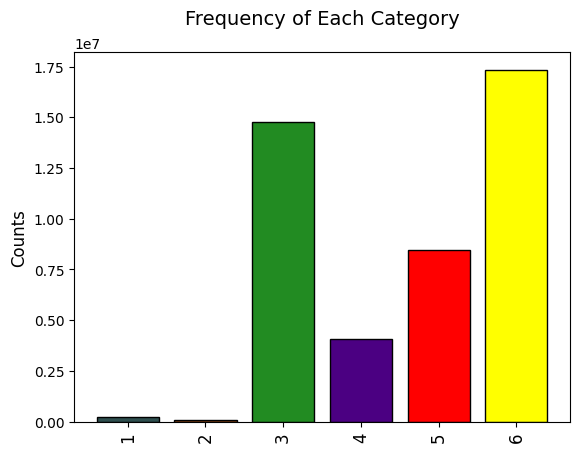

In [ ]:
## RUN this block for the plot
CATEGORIES = {'1': 0, '2': 1, '3': 2, '4': 3, '5': 4, '6': 5}
COLOR_MAP = {
    0  : (47, 79, 79),
    1  : (139, 69, 19),
    2  : (34, 139, 34),
    3  : (75, 0, 130),
    4  : (255, 0, 0),
    5  : (255, 255, 0)}
v_map_colors = np.vectorize(lambda x : COLOR_MAP[x])
NUM_CLASSES = len(CATEGORIES)
total_train_targets = []
train_dataloader = get_data_loader("seg",32, True)
for (_, targets) in train_dataloader:
    total_train_targets += targets.reshape(-1).numpy().tolist()

total_train_targets = np.array(total_train_targets)
class_bins = np.bincount(total_train_targets)

plt.bar(list(CATEGORIES.keys()), class_bins,
             color=[np.array(val)/255. for val in list(COLOR_MAP.values())],
             edgecolor='black')
plt.xticks(list(CATEGORIES.keys()), list(CATEGORIES.keys()), size=12, rotation=90)
plt.ylabel('Counts', size=12)
plt.title('Frequency of Each Category', size=14, pad=20);

We observe a significant imbalance in the dataset. Penalizing the network equally for misclassifying categories of varying frequencies wouldn't be logical. If we penalize high-frequency categories the same as low-frequency ones, the model might excel at capturing common patterns but struggle with rare features.

For this reason, we define a few weights for the loss function that correspond to the different classes. These are learnable parameters and we are initializing them manually as per the visualization. You are free to experiment with them as you please.

In [ ]:
alpha = np.ones(6)
alpha[5] *= 0.25
alpha[2] *= 0.35
alpha[4] *= 0.45
alpha[3] *= 0.5

Initialize the cross entropy loss with the weights and perform the forward pass. Refer to the pytorch documentation on Cross Entropy loss for  more information.

In [ ]:
class PointNetSegLoss(nn.Module):
    def __init__(self, alpha):
        super(PointNetSegLoss, self).__init__()
        self.alpha = alpha
        self.alpha = torch.tensor(alpha, dtype=torch.float32).cuda()  # Ensure alpha is a torch tensor on GPU if available
        self.ce_loss = nn.CrossEntropyLoss(weight=self.alpha)
        #########################################
        #############YOUR CODE HERE##############
        #########################################

        ##########################################

    def forward(self, predictions, targets):
        loss = None
        #########################################
        #############YOUR CODE HERE##############
        #########################################
        loss = self.ce_loss(predictions, targets)

        ##########################################
        return loss

## Q4c. Training the Network

To train the network the following steps need to be followed:

i. Check and convert the dimensions into proper order. Recall, the model needs the data to be in ```B x C x N``` format where B is the batch, C is the channels and N is the number of points

ii. The dataset contains 10000 points per point clouds. To reduce computation, we are only using 2000 points per point cloud. Slice the data so that you are only using 2000 points.

iii. Compute Forward pass

iv. Calculate the Loss. Here the ```PointNetSegLoss``` is passed as the argument ```criterion``` in the function

v. Perform back propogation and optimize

In [ ]:
def train_segmentation_model(train_dataloader, model, opt, epoch, device, criterion, num_seg_classes = 6):
    model.train()

    step = epoch*len(train_dataloader)
    epoch_loss = 0
    print("hello")
    for i, batch in enumerate(train_dataloader):
        point_clouds, labels = batch
        point_clouds = point_clouds.transpose(1,2)
        point_clouds = point_clouds.to(device)
        labels = labels.to(device).to(torch.long)
        #point_clouds = point_clouds.permute(0, 2, 1).contiguous().to(device)
        #point_clouds = point_clouds.permute(0, 2, 1).to(device)
        print(point_clouds.size())
        #########################################
        #############YOUR CODE HERE##############
        #########################################

        predictions = model(point_clouds[:, :, :NUM_TRAIN_POINTS])
        loss = criterion(predictions, labels[:, :NUM_TRAIN_POINTS])
        loss.backward()
        opt.step()
        opt.zero_grad()

        epoch_loss += loss.item()
        ##########################################




        #########################################
        #############YOUR CODE HERE##############
        #########################################
        #loss = None


        ##########################################
        epoch_loss += loss

    return epoch_loss

## Q4d. Testing the Network

i. Perform the same steps as Q4c to prepare the data for the network.

ii. Get the predictions from your network. Remember to not compute gradients or the loss!

iii. Get the prediction with highest probability from the output by using ```torch.softmax```

iv. Calculate the accuracy of the model by comparing how many predictions correctly match the labels and dividing the number by total number of datapoints

In [ ]:
def test_segmentation_model(test_dataloader, model, epoch, device):

    model.eval()
    correct_point = 0
    num_point = 0
    for batch in test_dataloader:
        point_clouds, labels = batch
        #point_clouds = point_clouds.to(device)
        labels = labels.to(device).to(torch.long)
        point_clouds = point_clouds.transpose(1,2)
        point_clouds = point_clouds.to(device)
        #########################################
        #############YOUR CODE HERE##############
        #########################################
        #point_clouds = point_clouds.to(device)
        labels = labels.to(device).to(torch.long)
        labels = labels.to(device).to(torch.long)[:, :2000]
        with torch.no_grad():
            predictions = model(point_clouds[:, :, :NUM_TRAIN_POINTS])

            softmax_predictions = torch.softmax(predictions, dim=1)
            _, predicted_labels = torch.max(softmax_predictions, dim=1)

            correct_point += (predicted_labels == labels).sum().item()
            num_point += labels.numel()

    accuracy = correct_point / num_point



        #predictions = None


        ##########################################
    accuracy = correct_point / num_point

    return accuracy

## Running the Model

In [ ]:
NUM_CLASSES = 6
NUM_TRAIN_POINTS = 2000
learning_rate = 0.001
path = "seg"
batch_size = 32
num_epochs = 150
model = SegmentationNetwork(NUM_TRAIN_POINTS, NUM_CLASSES)
model_save_path = os.path.join(os. getcwd(), 'best_seg_model.pt')
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')
opt = optim.Adam(model.parameters(), learning_rate)
train_dataloader = get_data_loader(path,batch_size, True)
test_dataloader = get_data_loader(path,batch_size, False)


alpha = np.ones(6)
alpha[-1] *= 0.25
alpha[2] *= 0.35
alpha[4] *= 0.45
alpha[3] *= 0.5

criterion = PointNetSegLoss(alpha=alpha).to(device)

model = model.to(device)
print("++++++ SUCCESSFULLY LOADED DATA ++++++")

best_accuracy = -1

for epoch in tqdm(range(num_epochs)):
    train_epoch_loss = train_segmentation_model(train_dataloader, model, opt, epoch, device, criterion)

    test_accuracy = test_segmentation_model(test_dataloader, model, epoch, device)
    print ("epoch: {}   train loss: {:.4f}   test accuracy: {:.4f}".format(epoch, train_epoch_loss, test_accuracy))

    if (test_accuracy > best_accuracy):
        best_accuracy = test_accuracy
        torch.save(model.state_dict(), model_save_path)

print("===============TRAINING COMPLETE===============")

++++++ SUCCESSFULLY LOADED DATA ++++++


  0%|          | 0/150 [00:00<?, ?it/s]

hello


  1%|          | 1/150 [00:19<47:58, 19.32s/it]

epoch: 0   train loss: 145.1206   test accuracy: 0.8093
hello


  1%|▏         | 2/150 [00:38<47:51, 19.40s/it]

epoch: 1   train loss: 107.4261   test accuracy: 0.4978
hello


  2%|▏         | 3/150 [00:58<48:09, 19.65s/it]

epoch: 2   train loss: 102.9473   test accuracy: 0.8206
hello


  3%|▎         | 4/150 [01:19<48:25, 19.90s/it]

epoch: 3   train loss: 95.9233   test accuracy: 0.8242
hello


  3%|▎         | 5/150 [01:38<48:07, 19.91s/it]

epoch: 4   train loss: 92.1467   test accuracy: 0.7259
hello


  4%|▍         | 6/150 [01:59<48:00, 20.01s/it]

epoch: 5   train loss: 88.1742   test accuracy: 0.8440
hello


  5%|▍         | 7/150 [02:19<47:39, 20.00s/it]

epoch: 6   train loss: 86.9380   test accuracy: 0.7479
hello


  5%|▌         | 8/150 [02:39<47:33, 20.09s/it]

epoch: 7   train loss: 83.1231   test accuracy: 0.8441
hello


  6%|▌         | 9/150 [02:59<47:23, 20.17s/it]

epoch: 8   train loss: 83.0526   test accuracy: 0.6557
hello


  7%|▋         | 10/150 [03:20<47:07, 20.20s/it]

epoch: 9   train loss: 80.8831   test accuracy: 0.7864
hello


  7%|▋         | 11/150 [03:40<46:47, 20.20s/it]

epoch: 10   train loss: 78.9007   test accuracy: 0.7616
hello


  8%|▊         | 12/150 [04:00<46:36, 20.26s/it]

epoch: 11   train loss: 76.9394   test accuracy: 0.6336
hello


  9%|▊         | 13/150 [04:20<46:12, 20.24s/it]

epoch: 12   train loss: 75.5883   test accuracy: 0.7290
hello


  9%|▉         | 14/150 [04:41<45:58, 20.29s/it]

epoch: 13   train loss: 73.2726   test accuracy: 0.7866
hello


 10%|█         | 15/150 [05:01<45:35, 20.27s/it]

epoch: 14   train loss: 72.6645   test accuracy: 0.7613
hello


 11%|█         | 16/150 [05:21<45:24, 20.33s/it]

epoch: 15   train loss: 71.8230   test accuracy: 0.8256
hello


 11%|█▏        | 17/150 [05:42<45:01, 20.31s/it]

epoch: 16   train loss: 70.2944   test accuracy: 0.8380
hello


 12%|█▏        | 18/150 [06:02<44:48, 20.36s/it]

epoch: 17   train loss: 68.4192   test accuracy: 0.7588
hello


 13%|█▎        | 19/150 [06:23<44:44, 20.49s/it]

epoch: 18   train loss: 67.2782   test accuracy: 0.5667
hello


 13%|█▎        | 20/150 [06:44<44:39, 20.61s/it]

epoch: 19   train loss: 67.3062   test accuracy: 0.6918
hello


 14%|█▍        | 21/150 [07:04<44:17, 20.60s/it]

epoch: 20   train loss: 65.5357   test accuracy: 0.8663
hello


 15%|█▍        | 22/150 [07:25<44:02, 20.64s/it]

epoch: 21   train loss: 64.1740   test accuracy: 0.7830
hello


 15%|█▌        | 23/150 [07:46<43:40, 20.63s/it]

epoch: 22   train loss: 62.7839   test accuracy: 0.6831
hello


 16%|█▌        | 24/150 [08:07<43:24, 20.67s/it]

epoch: 23   train loss: 62.3439   test accuracy: 0.8173
hello


 17%|█▋        | 25/150 [08:27<42:58, 20.63s/it]

epoch: 24   train loss: 61.7462   test accuracy: 0.3524
hello


 17%|█▋        | 26/150 [08:48<42:40, 20.65s/it]

epoch: 25   train loss: 61.1402   test accuracy: 0.8813
hello


 18%|█▊        | 27/150 [09:08<42:17, 20.63s/it]

epoch: 26   train loss: 59.7103   test accuracy: 0.7211
hello


 19%|█▊        | 28/150 [09:29<42:00, 20.66s/it]

epoch: 27   train loss: 58.0454   test accuracy: 0.8413
hello


 19%|█▉        | 29/150 [09:50<41:37, 20.64s/it]

epoch: 28   train loss: 58.5451   test accuracy: 0.8626
hello


 20%|██        | 30/150 [10:10<41:22, 20.69s/it]

epoch: 29   train loss: 59.1406   test accuracy: 0.8644
hello


 21%|██        | 31/150 [10:31<40:59, 20.66s/it]

epoch: 30   train loss: 57.6383   test accuracy: 0.8599
hello


 21%|██▏       | 32/150 [10:52<40:41, 20.69s/it]

epoch: 31   train loss: 55.6530   test accuracy: 0.8567
hello


 22%|██▏       | 33/150 [11:12<40:18, 20.68s/it]

epoch: 32   train loss: 55.6277   test accuracy: 0.6767
hello


 23%|██▎       | 34/150 [11:33<40:01, 20.71s/it]

epoch: 33   train loss: 56.0557   test accuracy: 0.7774
hello


 23%|██▎       | 35/150 [11:54<39:36, 20.66s/it]

epoch: 34   train loss: 54.5106   test accuracy: 0.8189
hello


 24%|██▍       | 36/150 [12:15<39:19, 20.70s/it]

epoch: 35   train loss: 52.7232   test accuracy: 0.7174
hello


 25%|██▍       | 37/150 [12:35<38:54, 20.66s/it]

epoch: 36   train loss: 53.2200   test accuracy: 0.7784
hello


 25%|██▌       | 38/150 [12:56<38:36, 20.68s/it]

epoch: 37   train loss: 52.4917   test accuracy: 0.6125
hello


 26%|██▌       | 39/150 [13:16<38:10, 20.64s/it]

epoch: 38   train loss: 50.7384   test accuracy: 0.8268
hello


 27%|██▋       | 40/150 [13:37<37:55, 20.69s/it]

epoch: 39   train loss: 50.5848   test accuracy: 0.7621
hello


 27%|██▋       | 41/150 [13:58<37:32, 20.66s/it]

epoch: 40   train loss: 50.3811   test accuracy: 0.8848
hello


 28%|██▊       | 42/150 [14:18<37:11, 20.66s/it]

epoch: 41   train loss: 53.6293   test accuracy: 0.8685
hello


 29%|██▊       | 43/150 [14:39<36:46, 20.62s/it]

epoch: 42   train loss: 52.6987   test accuracy: 0.8195
hello


 29%|██▉       | 44/150 [15:00<36:26, 20.63s/it]

epoch: 43   train loss: 49.8014   test accuracy: 0.8080
hello


 30%|███       | 45/150 [15:20<36:03, 20.60s/it]

epoch: 44   train loss: 47.9130   test accuracy: 0.8034
hello


 31%|███       | 46/150 [15:41<35:45, 20.63s/it]

epoch: 45   train loss: 47.6394   test accuracy: 0.8189
hello


 31%|███▏      | 47/150 [16:01<35:22, 20.61s/it]

epoch: 46   train loss: 48.1099   test accuracy: 0.8720
hello


 32%|███▏      | 48/150 [16:22<35:03, 20.62s/it]

epoch: 47   train loss: 47.5131   test accuracy: 0.8784
hello


 33%|███▎      | 49/150 [16:43<34:39, 20.59s/it]

epoch: 48   train loss: 47.2451   test accuracy: 0.8146
hello


 33%|███▎      | 50/150 [17:03<34:23, 20.64s/it]

epoch: 49   train loss: 46.6697   test accuracy: 0.8359
hello


 34%|███▍      | 51/150 [17:24<34:02, 20.63s/it]

epoch: 50   train loss: 47.3981   test accuracy: 0.8692
hello


 35%|███▍      | 52/150 [17:45<33:42, 20.64s/it]

epoch: 51   train loss: 46.5168   test accuracy: 0.8280
hello


 35%|███▌      | 53/150 [18:05<33:19, 20.62s/it]

epoch: 52   train loss: 46.5357   test accuracy: 0.8371
hello


 36%|███▌      | 54/150 [18:26<33:00, 20.63s/it]

epoch: 53   train loss: 44.5676   test accuracy: 0.8741
hello


 37%|███▋      | 55/150 [18:46<32:38, 20.61s/it]

epoch: 54   train loss: 44.6246   test accuracy: 0.8671
hello


 37%|███▋      | 56/150 [19:07<32:20, 20.64s/it]

epoch: 55   train loss: 43.9945   test accuracy: 0.8528
hello


 38%|███▊      | 57/150 [19:28<32:01, 20.66s/it]

epoch: 56   train loss: 44.4488   test accuracy: 0.8532
hello


 39%|███▊      | 58/150 [19:49<31:43, 20.69s/it]

epoch: 57   train loss: 43.8803   test accuracy: 0.8443
hello


 39%|███▉      | 59/150 [20:09<31:20, 20.66s/it]

epoch: 58   train loss: 42.6734   test accuracy: 0.8594
hello


 40%|████      | 60/150 [20:30<31:00, 20.67s/it]

epoch: 59   train loss: 42.6014   test accuracy: 0.8604
hello


 41%|████      | 61/150 [20:51<30:40, 20.68s/it]

epoch: 60   train loss: 42.1342   test accuracy: 0.8324
hello


 41%|████▏     | 62/150 [21:11<30:23, 20.72s/it]

epoch: 61   train loss: 41.6430   test accuracy: 0.8247
hello


 42%|████▏     | 63/150 [21:32<30:00, 20.69s/it]

epoch: 62   train loss: 41.7895   test accuracy: 0.7989
hello


 43%|████▎     | 64/150 [21:53<29:42, 20.72s/it]

epoch: 63   train loss: 41.1664   test accuracy: 0.8731
hello


 43%|████▎     | 65/150 [22:14<29:20, 20.71s/it]

epoch: 64   train loss: 41.0607   test accuracy: 0.8822
hello


 44%|████▍     | 66/150 [22:34<29:00, 20.72s/it]

epoch: 65   train loss: 41.0618   test accuracy: 0.6910
hello


 45%|████▍     | 67/150 [22:55<28:39, 20.71s/it]

epoch: 66   train loss: 40.6409   test accuracy: 0.8612
hello


 45%|████▌     | 68/150 [23:16<28:18, 20.71s/it]

epoch: 67   train loss: 40.3925   test accuracy: 0.8650
hello


 46%|████▌     | 69/150 [23:36<27:59, 20.74s/it]

epoch: 68   train loss: 40.4528   test accuracy: 0.8915
hello


 47%|████▋     | 70/150 [23:57<27:38, 20.73s/it]

epoch: 69   train loss: 40.4190   test accuracy: 0.8770
hello


 47%|████▋     | 71/150 [24:18<27:16, 20.72s/it]

epoch: 70   train loss: 39.3639   test accuracy: 0.8169
hello


 48%|████▊     | 72/150 [24:39<26:54, 20.70s/it]

epoch: 71   train loss: 39.5573   test accuracy: 0.8624
hello


 49%|████▊     | 73/150 [24:59<26:31, 20.66s/it]

epoch: 72   train loss: 39.9584   test accuracy: 0.8825
hello


 49%|████▉     | 74/150 [25:20<26:10, 20.66s/it]

epoch: 73   train loss: 42.8035   test accuracy: 0.8542
hello


 50%|█████     | 75/150 [25:40<25:46, 20.62s/it]

epoch: 74   train loss: 38.9100   test accuracy: 0.8538
hello


 51%|█████     | 76/150 [26:01<25:26, 20.63s/it]

epoch: 75   train loss: 38.2394   test accuracy: 0.8851
hello


 51%|█████▏    | 77/150 [26:21<25:04, 20.61s/it]

epoch: 76   train loss: 38.6425   test accuracy: 0.8385
hello


 52%|█████▏    | 78/150 [26:42<24:44, 20.62s/it]

epoch: 77   train loss: 45.2925   test accuracy: 0.8631
hello


 53%|█████▎    | 79/150 [27:03<24:23, 20.61s/it]

epoch: 78   train loss: 39.2763   test accuracy: 0.8541
hello


 53%|█████▎    | 80/150 [27:23<24:03, 20.63s/it]

epoch: 79   train loss: 37.4571   test accuracy: 0.8704
hello


 54%|█████▍    | 81/150 [27:44<23:42, 20.62s/it]

epoch: 80   train loss: 37.8285   test accuracy: 0.8824
hello


 55%|█████▍    | 82/150 [28:05<23:23, 20.64s/it]

epoch: 81   train loss: 38.0811   test accuracy: 0.8762
hello


 55%|█████▌    | 83/150 [28:25<23:01, 20.62s/it]

epoch: 82   train loss: 37.4105   test accuracy: 0.8749
hello


 56%|█████▌    | 84/150 [28:46<22:41, 20.63s/it]

epoch: 83   train loss: 41.0602   test accuracy: 0.8374
hello


 57%|█████▋    | 85/150 [29:07<22:21, 20.63s/it]

epoch: 84   train loss: 37.0772   test accuracy: 0.8833
hello


 57%|█████▋    | 86/150 [29:27<22:01, 20.65s/it]

epoch: 85   train loss: 35.9711   test accuracy: 0.8673
hello


 58%|█████▊    | 87/150 [29:48<21:39, 20.62s/it]

epoch: 86   train loss: 36.3173   test accuracy: 0.8637
hello


 59%|█████▊    | 88/150 [30:08<21:19, 20.64s/it]

epoch: 87   train loss: 35.4326   test accuracy: 0.8658
hello


 59%|█████▉    | 89/150 [30:29<20:57, 20.62s/it]

epoch: 88   train loss: 35.7262   test accuracy: 0.8371
hello


 60%|██████    | 90/150 [30:50<20:37, 20.63s/it]

epoch: 89   train loss: 36.2932   test accuracy: 0.8697
hello


 61%|██████    | 91/150 [31:10<20:14, 20.58s/it]

epoch: 90   train loss: 35.1196   test accuracy: 0.8823
hello


 61%|██████▏   | 92/150 [31:31<19:57, 20.65s/it]

epoch: 91   train loss: 34.5680   test accuracy: 0.8502
hello


 62%|██████▏   | 93/150 [31:51<19:34, 20.60s/it]

epoch: 92   train loss: 37.1420   test accuracy: 0.8617
hello


 63%|██████▎   | 94/150 [32:12<19:15, 20.64s/it]

epoch: 93   train loss: 35.9620   test accuracy: 0.8802
hello


 63%|██████▎   | 95/150 [32:33<18:53, 20.60s/it]

epoch: 94   train loss: 34.4506   test accuracy: 0.8704
hello


 64%|██████▍   | 96/150 [32:53<18:34, 20.63s/it]

epoch: 95   train loss: 34.7560   test accuracy: 0.8719
hello


 65%|██████▍   | 97/150 [33:14<18:11, 20.60s/it]

epoch: 96   train loss: 35.2560   test accuracy: 0.8827
hello


 65%|██████▌   | 98/150 [33:35<17:52, 20.62s/it]

epoch: 97   train loss: 35.4343   test accuracy: 0.8897
hello


 66%|██████▌   | 99/150 [33:55<17:30, 20.61s/it]

epoch: 98   train loss: 34.2996   test accuracy: 0.8946
hello


 67%|██████▋   | 100/150 [34:16<17:11, 20.64s/it]

epoch: 99   train loss: 35.6307   test accuracy: 0.8463
hello


 67%|██████▋   | 101/150 [34:36<16:50, 20.63s/it]

epoch: 100   train loss: 49.8657   test accuracy: 0.8730
hello


 68%|██████▊   | 102/150 [34:57<16:33, 20.70s/it]

epoch: 101   train loss: 36.7392   test accuracy: 0.9027
hello


 69%|██████▊   | 103/150 [35:18<16:10, 20.64s/it]

epoch: 102   train loss: 35.3401   test accuracy: 0.8603
hello


 69%|██████▉   | 104/150 [35:39<15:49, 20.65s/it]

epoch: 103   train loss: 34.7542   test accuracy: 0.8758
hello


 70%|███████   | 105/150 [35:59<15:27, 20.61s/it]

epoch: 104   train loss: 33.7024   test accuracy: 0.8301
hello


 71%|███████   | 106/150 [36:20<15:07, 20.64s/it]

epoch: 105   train loss: 32.9482   test accuracy: 0.6689
hello


 71%|███████▏  | 107/150 [36:40<14:45, 20.60s/it]

epoch: 106   train loss: 33.1199   test accuracy: 0.8865
hello


 72%|███████▏  | 108/150 [37:01<14:25, 20.60s/it]

epoch: 107   train loss: 32.4378   test accuracy: 0.8908
hello


 73%|███████▎  | 109/150 [37:21<14:02, 20.56s/it]

epoch: 108   train loss: 32.0783   test accuracy: 0.8970
hello


 73%|███████▎  | 110/150 [37:42<13:42, 20.57s/it]

epoch: 109   train loss: 33.4172   test accuracy: 0.8814
hello


 74%|███████▍  | 111/150 [38:02<13:21, 20.56s/it]

epoch: 110   train loss: 33.8039   test accuracy: 0.8646
hello


 75%|███████▍  | 112/150 [38:23<13:02, 20.58s/it]

epoch: 111   train loss: 32.6756   test accuracy: 0.8299
hello


 75%|███████▌  | 113/150 [38:44<12:41, 20.59s/it]

epoch: 112   train loss: 32.2268   test accuracy: 0.8773
hello


 76%|███████▌  | 114/150 [39:04<12:22, 20.62s/it]

epoch: 113   train loss: 32.3907   test accuracy: 0.8852
hello


 77%|███████▋  | 115/150 [39:25<12:02, 20.63s/it]

epoch: 114   train loss: 32.3085   test accuracy: 0.8286
hello


 77%|███████▋  | 116/150 [39:46<11:42, 20.65s/it]

epoch: 115   train loss: 33.1333   test accuracy: 0.8957
hello


 78%|███████▊  | 117/150 [40:06<11:20, 20.63s/it]

epoch: 116   train loss: 33.5213   test accuracy: 0.8606
hello


 79%|███████▊  | 118/150 [40:27<10:59, 20.61s/it]

epoch: 117   train loss: 32.5485   test accuracy: 0.8817
hello


 79%|███████▉  | 119/150 [40:47<10:38, 20.58s/it]

epoch: 118   train loss: 33.1987   test accuracy: 0.8760
hello


 80%|████████  | 120/150 [41:08<10:17, 20.59s/it]

epoch: 119   train loss: 31.5693   test accuracy: 0.8886
hello


 81%|████████  | 121/150 [41:29<09:56, 20.56s/it]

epoch: 120   train loss: 31.8048   test accuracy: 0.8701
hello


 81%|████████▏ | 122/150 [41:49<09:35, 20.57s/it]

epoch: 121   train loss: 32.2945   test accuracy: 0.8593
hello


 82%|████████▏ | 123/150 [42:10<09:16, 20.61s/it]

epoch: 122   train loss: 30.8869   test accuracy: 0.8598
hello


 83%|████████▎ | 124/150 [42:31<08:56, 20.63s/it]

epoch: 123   train loss: 31.3765   test accuracy: 0.8687
hello


 83%|████████▎ | 125/150 [42:51<08:35, 20.61s/it]

epoch: 124   train loss: 31.9275   test accuracy: 0.8907
hello


 84%|████████▍ | 126/150 [43:12<08:14, 20.60s/it]

epoch: 125   train loss: 31.6109   test accuracy: 0.8743
hello


 85%|████████▍ | 127/150 [43:32<07:52, 20.54s/it]

epoch: 126   train loss: 32.0517   test accuracy: 0.8966
hello


 85%|████████▌ | 128/150 [43:53<07:31, 20.54s/it]

epoch: 127   train loss: 31.1039   test accuracy: 0.9003
hello


 86%|████████▌ | 129/150 [44:13<07:10, 20.51s/it]

epoch: 128   train loss: 33.7682   test accuracy: 0.8572
hello


 87%|████████▋ | 130/150 [44:34<06:50, 20.52s/it]

epoch: 129   train loss: 31.4558   test accuracy: 0.8641
hello


 87%|████████▋ | 131/150 [44:54<06:29, 20.51s/it]

epoch: 130   train loss: 31.7030   test accuracy: 0.8824
hello


 88%|████████▊ | 132/150 [45:15<06:09, 20.51s/it]

epoch: 131   train loss: 30.5649   test accuracy: 0.8852
hello


 89%|████████▊ | 133/150 [45:35<05:48, 20.50s/it]

epoch: 132   train loss: 29.9251   test accuracy: 0.8869
hello


 89%|████████▉ | 134/150 [45:56<05:28, 20.56s/it]

epoch: 133   train loss: 31.0068   test accuracy: 0.8807
hello


 90%|█████████ | 135/150 [46:16<05:07, 20.53s/it]

epoch: 134   train loss: 31.1259   test accuracy: 0.8933
hello


 91%|█████████ | 136/150 [46:37<04:47, 20.53s/it]

epoch: 135   train loss: 29.9991   test accuracy: 0.8869
hello


 91%|█████████▏| 137/150 [46:57<04:26, 20.51s/it]

epoch: 136   train loss: 29.7373   test accuracy: 0.8951
hello


 92%|█████████▏| 138/150 [47:18<04:06, 20.52s/it]

epoch: 137   train loss: 30.1511   test accuracy: 0.8863
hello


 93%|█████████▎| 139/150 [47:38<03:45, 20.52s/it]

epoch: 138   train loss: 29.3734   test accuracy: 0.8745
hello


 93%|█████████▎| 140/150 [47:59<03:25, 20.55s/it]

epoch: 139   train loss: 30.1652   test accuracy: 0.8991
hello


 94%|█████████▍| 141/150 [48:19<03:04, 20.55s/it]

epoch: 140   train loss: 30.5072   test accuracy: 0.8722
hello


 95%|█████████▍| 142/150 [48:40<02:44, 20.58s/it]

epoch: 141   train loss: 30.2400   test accuracy: 0.8903
hello


 95%|█████████▌| 143/150 [49:01<02:23, 20.56s/it]

epoch: 142   train loss: 29.7028   test accuracy: 0.8986
hello


 96%|█████████▌| 144/150 [49:21<02:03, 20.57s/it]

epoch: 143   train loss: 30.0474   test accuracy: 0.8910
hello


 97%|█████████▋| 145/150 [49:42<01:43, 20.63s/it]

epoch: 144   train loss: 29.7215   test accuracy: 0.8885
hello


 97%|█████████▋| 146/150 [50:02<01:22, 20.60s/it]

epoch: 145   train loss: 29.2864   test accuracy: 0.8711
hello


 98%|█████████▊| 147/150 [50:23<01:01, 20.61s/it]

epoch: 146   train loss: 29.9412   test accuracy: 0.8786
hello


 99%|█████████▊| 148/150 [50:44<00:41, 20.60s/it]

epoch: 147   train loss: 30.4173   test accuracy: 0.8726
hello


 99%|█████████▉| 149/150 [51:04<00:20, 20.66s/it]

epoch: 148   train loss: 29.7028   test accuracy: 0.8624
hello


100%|██████████| 150/150 [51:25<00:00, 20.57s/it]

epoch: 149   train loss: 29.5720   test accuracy: 0.8883
===============TRAINING COMPLETE===============


## Q4e. Inference

i. Visualize a few point clouds that have been segmented correctly. Make sure to use different colours for different classes

ii. Visualize few point clouds that have been segmented incorrectly. Make sure to use different colours for different classes

You can re-use functions defined previously

In [ ]:
from plotly.subplots import make_subplots


def visualize_segmentations(point_clouds, predicted_labels, true_labels, num_to_visualize=7):
    #print(segmentations.size())
    print(len(point_clouds[2,2]))
    for i in range(min(num_to_visualize, len(point_clouds))):
        fig = make_subplots(
            rows=1, cols=2,
            specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
            subplot_titles=('Predicted Segmentation', 'True Segmentation'))

        pc = point_clouds[i]
        pred_lbl = predicted_labels[i]
        true_lbl = true_labels[i]
        pred_colors = pred_lbl
        true_colors = true_lbl
        trace1 = go.Scatter3d(
            x=pc[0, :], y=pc[1, :], z=pc[2, :],
            mode='markers',
            marker=dict(
                size=3,
                color=pred_colors,
                colorscale='Jet',
                opacity=0.8,
                showscale=True)
        )

        trace2 = go.Scatter3d(
            x=pc[0, :], y=pc[1, :], z=pc[2, :],
            mode='markers',
            marker=dict(
                size=3,
                color=true_colors,
                colorscale='Jet',
                opacity=0.8,
                showscale=True)
        )

        fig.add_trace(trace1, row=1, col=1)
        fig.add_trace(trace2, row=1, col=2)
        fig.update_layout(height=400, width=800, title_text=f"Point Cloud {i + 1} Segmentation")
        fig.show()


saved_model = SegmentationNetwork(2000, 6).to(device)
model_save_path = os.path.join(os. getcwd(), 'best_seg_model.pt')
saved_model.load_state_dict(torch.load(model_save_path))
saved_model.eval()
path = "seg"
test_dataloader = get_data_loader(path,batch_size, False)
with torch.no_grad():
    for batch in test_dataloader:
        point_clouds, labels = batch
        point_clouds = point_clouds.transpose(1,2)
        point_clouds = point_clouds[:,:,:2000]
        labels = labels.to(device).to(torch.long)[:,:2000]
        point_clouds = point_clouds.to(device)
        predictions = saved_model(point_clouds)
        _, predicted_labels = torch.max(torch.softmax(predictions, dim=1), dim=1)

visualize_segmentations(point_clouds.cpu().numpy(), predicted_labels.cpu().numpy(), labels.cpu().numpy())

NameError: ignored

# Submission Instructions
Run the entire notebook and make sure all outputs are visible. ```We will NOT run your code.```

Rename the notebook as ```uniquename_assignment2.ipynb``` and submit the link of the notebook on canvas. Make sure to set proper access for your link so that anyone with the link can ```view``` your notebook
